# Data Science Practicum II
# Image Colorization

by Bekzod Sharipov

# Libraries used 
__Numpy__ : Fundamental package for scientific computing in Python3 <br>
__Matplotlib__ : A Python3 plotting library used for data visualization <br>
__SkImage__ : Is an open source Python3 package designed for image processing <br>
__Tensorflow__ : Is an open source deep learning framework for dataflow and differentiable programming <br>
__Tqdm__ : Is a progress bar library with good support for nested loops and Jupyter notebooks  <br>
__OpenCV__ :is a great tool for image processing and performing computer vision tasks.<br>
__Pandas__ : is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
%matplotlib inline
import cv2
import skimage.color as sk
from tqdm import tqdm_notebook as tqdm

# Dataset used
__Flickr-Faces-HQ (FFHQ)__ is a high-quality image dataset of human faces, originally created as a benchmark for generative adversarial networks (GAN):
The dataset consists of 20,000 high-quality PNG images at 1024×1024 resolution and contains considerable variation in terms of age, ethnicity and image background. It also has good coverage of accessories such as eyeglasses, sunglasses, hats, etc

![FFHQ](https://github.com/NVlabs/ffhq-dataset/raw/master/ffhq-teaser.png) <br>
https://paperswithcode.com/dataset/ffhq

In [6]:
path = "C:/Users/Bekzod/Desktop/Face/"

In [10]:
# First we need to rescale each image in the dataset,that the value of each pixel lies in the range of 0-1, instead of 0-255.
# After that the dataset is splitedt between train and test where test is equal to 20 percent of the dataset 
train_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1/255.0, validation_split= 0.20)

#All images in the dataset witll be resized to 224 x 224 dimensions. is is needed sizes for neural network imput size. Instead of feeding
# all images in our neural network at ones we will fed in batches of 32. in this case Jupyter notebook will not try to load all data.
train = train_gen.flow_from_directory(path, target_size = (224, 224), 
                                      batch_size = 32, class_mode = None, subset = "training")
test = train_gen.flow_from_directory(path, target_size = (224, 224), 
                                    batch_size = 32, class_mode = None, subset = "validation")

Found 16009 images belonging to 2 classes.
Found 4002 images belonging to 2 classes.


## Calculating number of batches

In [11]:
print(16000/32)
print(4000/32)

500.0
125.0


## Converting RGB images to Lab
Convert lab (for converting an RGB image into LAB format using the skimage library), convert rgb (for converting the constructed LAB image into RGB format after the A and B channels are predicted using the skimage image pre-processing library), and plot image (for displaying an image) are designed as helper functions.

![](https://www.nazdar.com/Portals/0/Tech_Service_Docs/TIPs/lab-sphere.jpg) ![](https://www.xrite.com/-/media/modules/weblog/blog/lab-color-space/lab-color-space.png?h=622&w=600&la=en&hash=53A76941BAB3015346FAB3689739E967843CF8EA)

In [12]:
def convert_lab(image) : 
  lab_image = sk.rgb2lab(image)
  return lab_image

def convert_rgb(image) : 
  rgb_image = sk.lab2rgb(image)
  return rgb_image
def plot_image(image) : 
  plt.figure(figsize = (6, 4))
  plt.imshow(image, cmap = "gray")

![](http://shutha.org/sites/default/files//uploads/3_Courses/3_Digital_Imaging/02%20LAB2b.jpg) <br>
http://shutha.org/node/851

### RGB Images

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/4160096792.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6, 4))


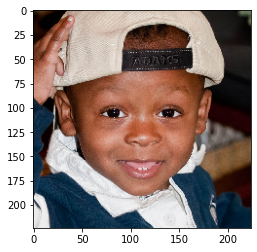

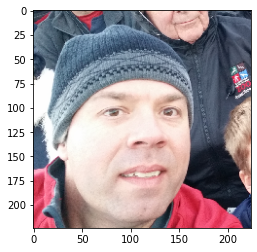

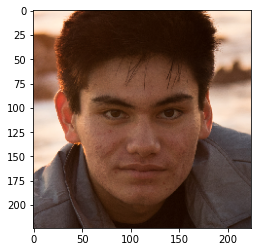

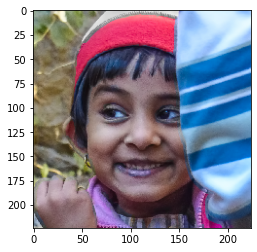

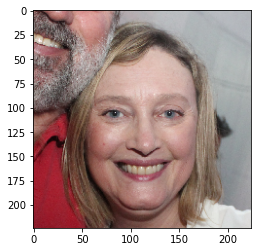

...

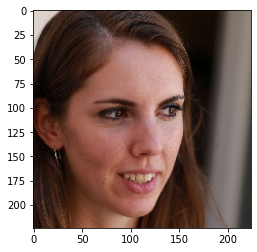

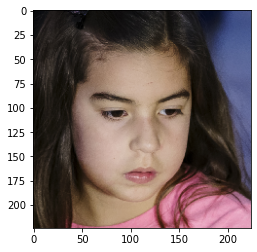

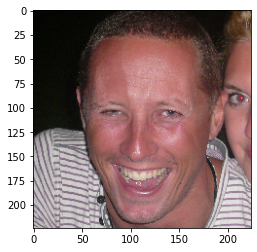

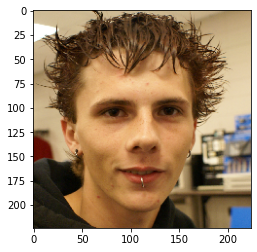

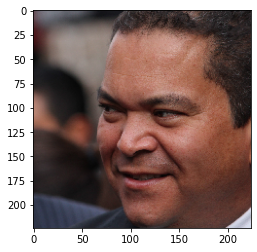

In [16]:
batch_of_images = train[5]
for i in batch_of_images : 
  plot_image(i)

### L Images


C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/4160096792.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6, 4))


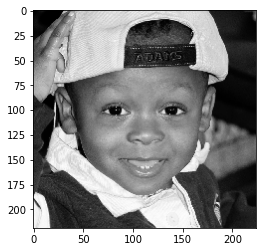

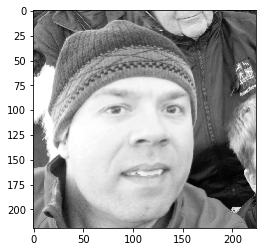

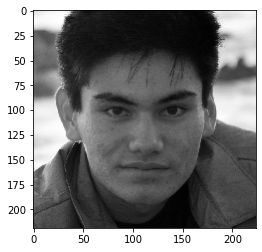

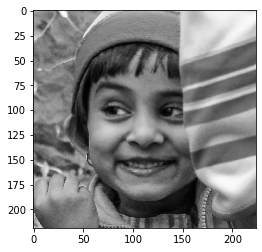

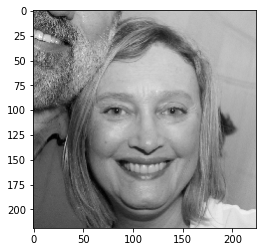

...

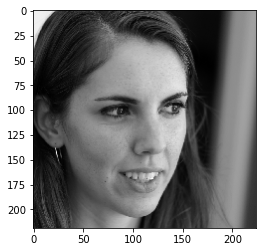

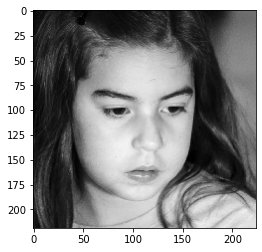

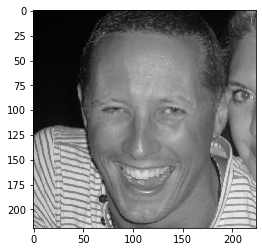

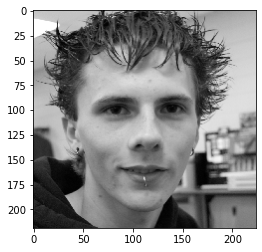

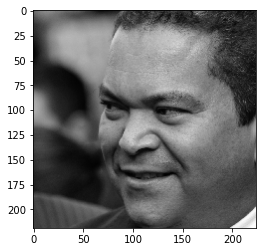

In [17]:
# plotting the L channel
for i in batch_of_images : 
  plot_image(convert_lab(i)[5:,:,0])

### a Images

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/4160096792.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6, 4))


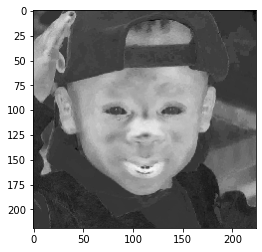

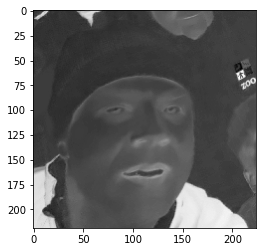

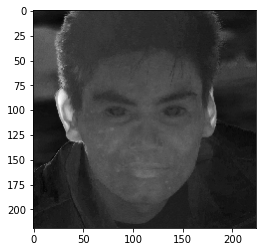

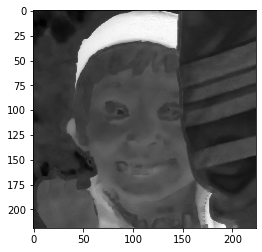

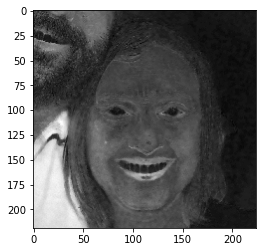

...

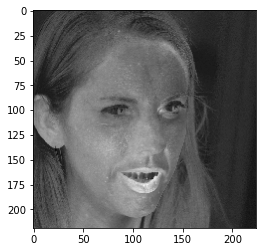

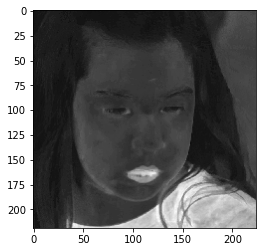

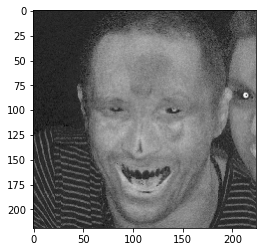

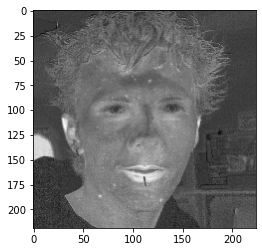

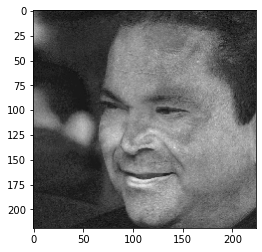

In [18]:
# plotting the a channel
for i in batch_of_images : 
  plot_image(convert_lab(i)[5:,:,1])

### b Images

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/4160096792.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6, 4))


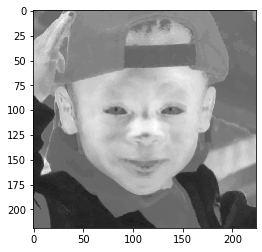

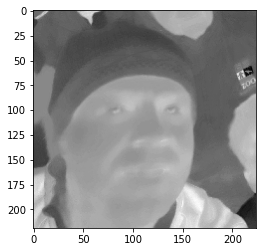

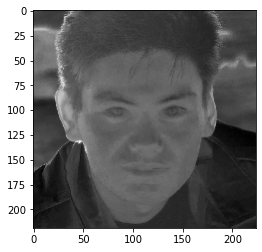

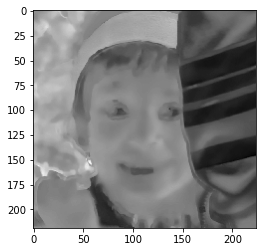

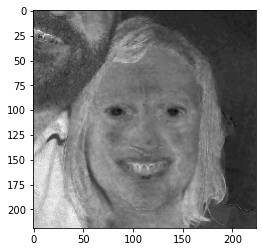

...

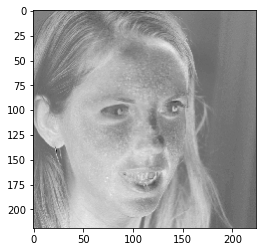

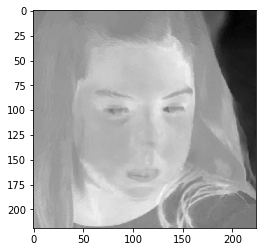

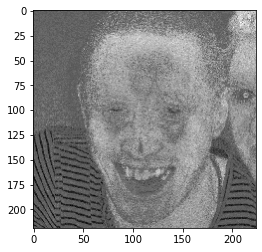

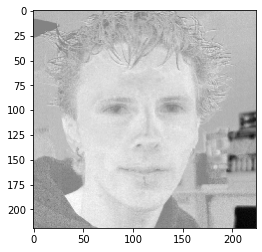

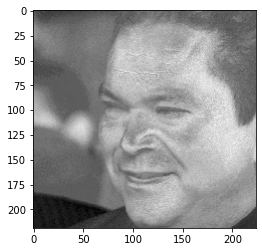

In [19]:
# plotting the b channel
for i in batch_of_images : 
  plot_image(convert_lab(i)[5:,:,2])

## Preparing the Numpy arrays

The numpy arrays for training and test are constructed. All of the photographs in the training set are loaded one by one and converted to LAB format thereafter. The 'L' channel of our LAB image is in the x train list, whereas the 'A' and 'B' channels are in the y train list. The same may be said for x test and y test. Finally, the list is turned into a numpy array, which is the Tensorflow input type.

In [20]:
x_train = []
y_train = []
for i in tqdm(range(499)) : 
  for image in train[i] : 
    try : 
      lab_image = convert_lab(image)
      x_train.append(lab_image[:,:,0])
      y_train.append(lab_image[:,:,1:] / 128)
    except : 
      print("Image might be broken")
x_train = np.array(x_train)
y_train = np.array(y_train)
print(x_train.shape)
print(y_train.shape)           

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/3666695092.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(499)) :


  0%|          | 0/499 [00:00<?, ?it/s]

(15968, 224, 224)
(15968, 224, 224, 2)


In [21]:
x_test = []       
y_test = []
for i in tqdm(range(124)) : 
  for image in test[i] : 
    try : 
      lab_image = convert_lab(image)
      x_test.append(lab_image[:,:,0])
      y_test.append(lab_image[:,:,1:] / 128)
    except : 
      print("Image might be broken")
x_test = np.array(x_test)
y_test = np.array(y_test)
print(x_test.shape)     
print(y_test.shape)

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/3087607668.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(124)) :


  0%|          | 0/124 [00:00<?, ?it/s]

(3968, 224, 224)
(3968, 224, 224, 2)


In [22]:
#Reshaping x train and x test and printing the shapes
x_train = x_train.reshape(x_train.shape[0], 224, 224, 1)
x_test = x_test.reshape(x_test.shape[0], 224, 224, 1)
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(15968, 224, 224, 1)
(15968, 224, 224, 2)
(3968, 224, 224, 1)
(3968, 224, 224, 2)


Saving arrays and loading back. It will help us to save time on converting 

In [23]:
#Saving results
np.save("x_train", x_train)
np.save("y_train", y_train)
np.save("x_test", x_test)
np.save("y_test", y_test)          

In [24]:
#loading results
x_train = np.load("x_train.npy")  
y_train = np.load("y_train.npy")
x_test = np.load("x_test.npy")        
y_test = np.load("y_test.npy")

# Deep Learning Architecture
Deep neural networks are used to determine a compressed version of the input data with the least amount of information loss using auto encoders. PCA (Principal Component Analysis) is a technique for determining the best and most relevant parameters for training a model with a large number of parameters in a dataset. In a similar way, an autoencoder works. The encoder component of the design compresses the input data, ensuring that vital information is preserved while the total size of the data is greatly decreased. 

In [25]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor= "loss", factor = 0.5, patience = 10,
                                                 min_lr = 0.000001, verbose = 1)
monitor_es = tf.keras.callbacks.EarlyStopping(monitor= "loss", patience = 25, restore_best_weights= False, verbose = True)

### Transfer Learning VVG-16

To achieve high accuracy in the feature extraction procedure, we chose VGG net 16 for our encoder. VGG-16's design is such that it receives an input of size 224 X 224 X 3 (thus the pre-processing image resizing) and returns a softmax prediction over a thousand classes. As a result, we'll use these layers to extract features for our own encoder.

![](https://miro.medium.com/max/940/1*3-TqqkRQ4rWLOMX-gvkYwA.png) <br>
https://neurohive.io/en/popular-networks/vgg16/

In [26]:
# transfer learning
vgg_model = tf.keras.applications.vgg16.VGG16()
transfer_learned_encoder_model = tf.keras.models.Sequential()
for i, layer in enumerate(vgg_model.layers):
  if i < 19 : 
    transfer_learned_encoder_model.add(layer)
for layer in transfer_learned_encoder_model.layers:
  layer.trainable = False

transfer_learned_encoder_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [27]:
vgg_features = []
for i, image in tqdm(enumerate(x_train)) : 
  image = cv2.merge((image, image, image))
  image = image.reshape((1,224, 224,3))
  prediction = transfer_learned_encoder_model.predict(image)
  prediction = prediction.reshape((7,7,512))
  vgg_features.append(prediction)
vgg_features = np.array(vgg_features)
print(vgg_features.shape)

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/3868757866.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, image in tqdm(enumerate(x_train)) :


0it [00:00, ?it/s]

(15968, 7, 7, 512)


### Autoencoder

![](https://editor.analyticsvidhya.com/uploads/98612autoencoder.JPG) <br>
https://www.kaggle.com/theblackmamba31/autoencoder-grayscale-to-color-image

### Building autoencoder model and displaying it

In [28]:
# Encoder
input_shape = (7, 7, 512)
i = tf.keras.layers.Input(shape = input_shape)  

#decoder
output = tf.keras.layers.Conv2D(filters = 128, kernel_size= (3,3), padding = "same", activation= "relu")(i)
output = tf.keras.layers.Conv2D(filters = 128, kernel_size= (3,3), padding = "same", activation= "relu")(i)
output = tf.keras.layers.Conv2D(filters = 128, kernel_size= (3,3), padding = "same", activation= "relu")(i)
output = tf.keras.layers.UpSampling2D((2, 2))(output)
output = tf.keras.layers.Conv2D(filters = 64, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 64, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 64, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.UpSampling2D((2, 2))(output)
output = tf.keras.layers.Conv2D(filters = 32, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 32, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 32, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.UpSampling2D((2, 2))(output)
output = tf.keras.layers.Conv2D(filters = 16, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 16, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.Conv2D(filters = 16, kernel_size= (3,3), padding = "same", activation= "relu")(output)
output = tf.keras.layers.UpSampling2D((2, 2))(output)
output = tf.keras.layers.Conv2D(filters = 2, kernel_size= (3,3), padding = "same", activation= "tanh")(output)
output = tf.keras.layers.UpSampling2D((2, 2))(output)

decoder_model = tf.keras.models.Model(inputs = i, outputs = output)
decoder_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 7, 7, 512)]       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 128)         589952    
                                                                 
 up_sampling2d (UpSampling2D  (None, 14, 14, 128)      0         
 )                                                               
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 64)        73792     
                                                                 
 conv2d_4 (Conv2D)           (None, 14, 14, 64)        36928     
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 14, 64)        36928     
                                                             

In [29]:
decoder_model.compile(optimizer= tf.keras.optimizers.Adam(lr = 0.001), loss = "MSE", metrics = ["accuracy"])

C:\Users\Bekzod\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


### Training 

In [30]:
EPOCHS = 2500
with tf.device("/device:GPU:0"):
  history = decoder_model.fit(vgg_features, y_train, epochs = EPOCHS, verbose = 1, 
                      callbacks = [reduce_lr, monitor_es], batch_size = 32)                                               

Epoch 1/2500
499/499 [==============================] - 11s 15ms/step - loss: 0.0100 - accuracy: 0.5624 - lr: 0.00100103 - accuracy - ETA: 2s - loss: 0.0 - ETA: 2s - loss: 0.0102 - accuracy:  - ETA: 0s - loss: 0.010
Epoch 2/2500
499/499 [==============================] - 8s 16ms/step - loss: 0.0093 - accuracy: 0.5729 - lr: 0.0010.0093 -  - ETA: 1s - loss: 0.0093 - accuracy
Epoch 3/2500
499/499 [==============================] - 8s 16ms/step - loss: 0.0091 - accuracy: 0.5831 - lr: 0.0010
Epoch 4/2500
499/499 [==============================] - 8s 15ms/step - loss: 0.0089 - accuracy: 0.5911 - lr: 0.0010
Epoch 5/2500
499/499 [==============================] - 8s 15ms/step - loss: 0.0086 - accuracy: 0.5917 - lr: 0.0010
Epoch 6/2500
499/499 [==============================] - 8s 15ms/step - loss: 0.0084 - accuracy: 0.5965 - lr: 0.0010.0083 - accuracy:  - ETA: 2s - los - ETA: 0s - loss: 0.0
Epoch 7/2500
499/499 [==============================] - 8s 15ms/step - loss: 0.0081 - accuracy: 0.6029 -

### Model Training History Graph

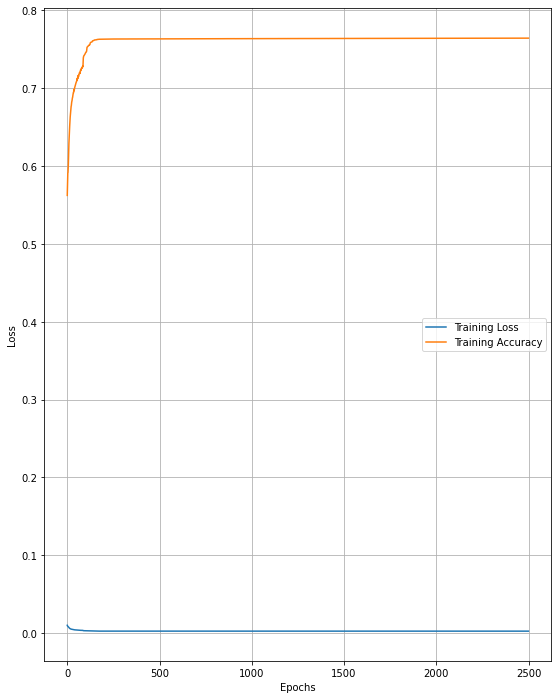

In [31]:
x = np.arange(0, EPOCHS, 1)                                                                  
plt.figure(1, figsize = (20, 12))                                  
plt.subplot(121)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history.history["loss"], label = "Training Loss")
plt.plot(x, history.history["accuracy"], label = "Training Accuracy")
plt.grid(True)                           
plt.legend()   

### Saving model which hase trained on 2500 epochs

In [32]:
!mkdir -p saved_model
transfer_learned_encoder_model.save('saved_model/encoder_model') 
decoder_model.save('saved_model/decoder_model')

A subdirectory or file saved_model already exists.
Error occurred while processing: saved_model.


INFO:tensorflow:Assets written to: saved_model/encoder_model\assets
INFO:tensorflow:Assets written to: saved_model/decoder_model\assets


### Testing results

In [33]:
test_images = x_test[:15]
vgg_features_test = []
for i, image in tqdm(enumerate(test_images)) :
  image = cv2.merge((image, image, image))
  image = image.reshape((1,224,224,3))
  prediction = transfer_learned_encoder_model.predict(image)
  prediction = prediction.reshape((7,7,512))
  vgg_features_test.append(prediction)
vgg_features_test = np.array(vgg_features_test)
print(vgg_features_test.shape)

C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/1522767973.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, image in tqdm(enumerate(test_images)) :


0it [00:00, ?it/s]

(15, 7, 7, 512)


In [34]:
ab_pred = decoder_model.predict(vgg_features_test)
ab_pred = ab_pred * 128
print(ab_pred.shape)

(15, 224, 224, 2)


In [35]:
print(test_images.shape)

(15, 224, 224, 1)


C:\Users\Bekzod\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 24 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\Bekzod\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1107 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\Bekzod\AppData\Local\Temp/ipykernel_5928/4160096792.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6, 4))
C:\Users\Bekzod\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


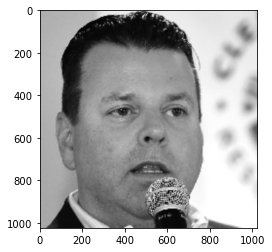

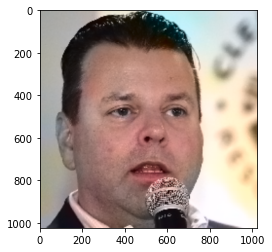

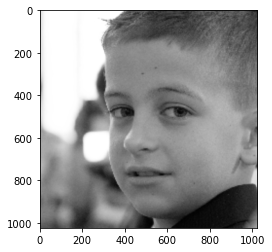

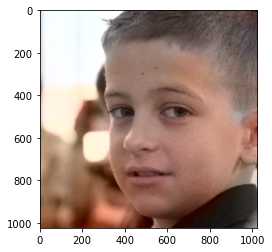

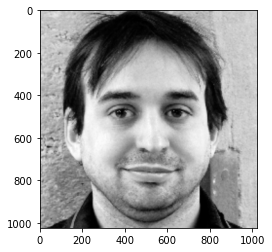

...

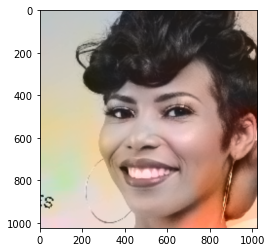

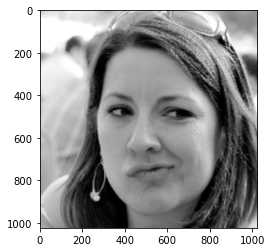

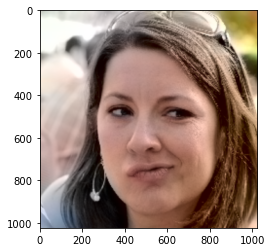

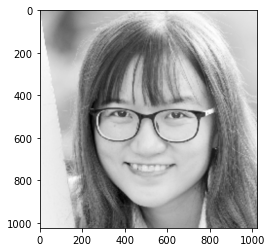

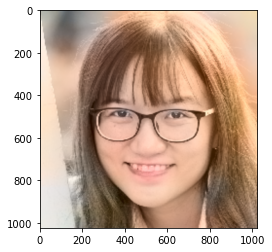

In [36]:
for i in range(test_images.shape[0]) : 
  image = test_images[i]
  image = image.reshape((224 , 224))
    
  reconstructed_image =  np.zeros((224, 224, 3))
  reconstructed_image[:,:,0] =  image
  reconstructed_image[:,:,1:] = ab_pred[i]
  reconstructed_image = convert_rgb(reconstructed_image)
  image = cv2.resize(image, (1024, 1024))
  reconstructed_image = cv2.resize(reconstructed_image, (1024, 1024))

  plot_image(image)
  plot_image(reconstructed_image) 